In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.linear_model import BayesianRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import ipywidgets as widgets
from IPython.display import display
from IPython.display import HTML



from scipy.stats import ttest_ind, ttest_ind_from_stats
from scipy.special import stdtr

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('omw-1.4')
from sklearn.feature_extraction.text import TfidfVectorizer

import warnings
warnings.filterwarnings('ignore')

import matplotlib.dates as mda

import string

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\ishio\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


# 1. Data Cleaning

In [50]:
# Reading the data
data = pd.read_csv('data/speed_dating.csv', encoding='ISO-8859-1')
data.shape

(8378, 195)

In [3]:
data.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN


In [4]:
pd.set_option('display.max_rows', None)

In [5]:
# Finding object type columns
obj_cols = data.select_dtypes(include='object').columns
print(obj_cols)

Index(['field', 'undergra', 'mn_sat', 'tuition', 'from', 'zipcode', 'income',
       'career'],
      dtype='object')


In [7]:
#Mnsat, tuition and income columns normally numeric values, we will change these columns

data['income'] = data['income'].str.replace(',', '')
data['income'] = pd.to_numeric(data['income'], errors='coerce')
data['mn_sat'] = pd.to_numeric(data['mn_sat'], errors='coerce')
data['tuition'] = pd.to_numeric(data['tuition'], errors='coerce')
data['zipcode'] = pd.to_numeric(data['zipcode'], errors='coerce')

In [8]:
all_na_rows = data[data.isna().all(axis=1)]
all_na_rows

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3


In [9]:
#Dropping columns
drop_list = ['attr1_3','sinc1_3','intel1_3','fun1_3','amb1_3','shar1_3','attr7_3','sinc7_3','intel7_3','fun7_3','amb7_3','shar7_3','attr4_3','sinc4_3','intel4_3','fun4_3','amb4_3','shar4_3','attr2_3',
             'sinc2_3','intel2_3','fun2_3','amb2_3','shar2_3','attr3_3','sinc3_3','intel3_3','fun3_3','amb3_3','attr5_3','sinc5_3','intel5_3','fun5_3','amb5_3','attr7_2','sinc7_2','intel7_2','fun7_2',
             'amb7_2','shar7_2','attr1_2','sinc1_2','intel1_2','fun1_2','amb1_2','shar1_2','attr4_2','sinc4_2','intel4_2','fun4_2','amb4_2','shar4_2','attr2_2','sinc2_2','intel2_2','fun2_2','amb2_2',
             'shar2_2','attr3_2','sinc3_2','intel3_2','fun3_2','amb3_2','attr5_2','sinc5_2','intel5_2','fun5_2','amb5_2','attr1_s','sinc1_s','intel1_s','fun1_s','amb1_s','shar1_s',
             'attr3_s','sinc3_s','intel3_s','fun3_s',
             'amb3_s','attr4_1','sinc4_1','intel4_1','fun4_1','amb4_1','shar4_1','order','iid','id','idg','round',
             'position','positin1','partner','pid','career','career_c','expnum',
             'you_call','them_cal','date_3','numdat_3','num_in_3','from','zipcode'
            ]

def dropping(df,lst):
    for e in lst:
        df.drop(e, axis=1,inplace=True)
        
    return df

dropping(data,drop_list)

,gender,condtn,wave,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,...,fun,amb,shar,like,prob,met,match_es,satis_2,length,numdat_2
0,0,1,1,0,0.14,0,27.0,2.0,35.00,20.00,...,7.0,6.0,5.0,7.0,6.0,2.0,4.0,6.0,2.0,1.0
1,0,1,1,0,0.54,0,22.0,2.0,60.00,0.00,...,8.0,5.0,6.0,7.0,5.0,1.0,4.0,6.0,2.0,1.0
2,0,1,1,1,0.16,1,22.0,4.0,19.00,18.00,...,8.0,5.0,7.0,7.0,NaN,1.0,4.0,6.0,2.0,1.0
3,0,1,1,1,0.61,0,23.0,2.0,30.00,5.00,...,7.0,6.0,8.0,7.0,6.0,2.0,4.0,6.0,2.0,1.0
4,0,1,1,1,0.21,0,24.0,3.0,30.00,10.00,...,7.0,6.0,6.0,6.0,6.0,2.0,4.0,6.0,2.0,1.0
5,0,1,1,0,0.25,0,25.0,2.0,50.00,0.00,...,4.0,6.0,4.0,6.0,5.0,2.0,4.0,6.0,2.0,1.0
6,0,1,1,0,0.34,0,30.0,2.0,35.00,15.00,...,4.0,6.0,7.0,6.0,5.0,2.0,4.0,6.0,2.0,1.0
7,0,1,1,0,0.50,0,27.0,2.0,33.33,11.11,...,6.0,5.0,6.0,6.0,7.0,NaN,4.0,6.0,2.0,1.0
8,0,1,1,1,0.28,0,28.0,2.0,50.00,0.00,...,9.0,8.0,8.0,7.0,7.0,2.0,4.0,6.0,2.0,1.0
9,0,1,1,0,-0.36,0,24.0,2.0,100.00,0.00,...,8.0,10.0,8.0,6.0,6.0,2.0,4.0,6.0,2.0,1.0


In [11]:
# Scaling data to make them have similar scales
scaler = MinMaxScaler()

scaler_list = ['attr1_1','sinc1_1','intel1_1','fun1_1','amb1_1','shar1_1','attr2_1','sinc2_1','intel2_1','fun2_1','amb2_1','shar2_1',
              'attr3_1','sinc3_1','intel3_1','fun3_1','amb3_1','attr5_1','sinc5_1','intel5_1','fun5_1','amb5_1']

def scalling(lst,df):
    for e in lst:
        e_standardized = scaler.fit_transform(df[e].values.reshape(-1, 1))
        df[e] = e_standardized
        
scalling(lst=scaler_list, df=data)     

##  Filling continuous values.

In [12]:
# Finding null % in continuous values

continuous_df =data [['mn_sat','tuition','age','age_o','int_corr','income']]
continuous_df.head()
continuous_df.head()
(continuous_df.isnull().mean()*100).sort_values(ascending=False)

tuition     100.000000
mn_sat       99.665791
income       48.925758
int_corr      1.885892
age_o         1.241346
age           1.133922
dtype: float64

Since tuition and mn_sat columns have lots of missing data, we will drop them to not miss lead the model.

In [13]:
conti=data[['mn_sat','tuition','age','age_o','int_corr','income']]
# Dropping these columns because they have too many null cells.
conti = conti.drop(['tuition'],axis=1)
conti = conti.drop(['mn_sat'],axis=1)

To fill the rest of the continuous columns we will use the method KNNImputer().

To use this method, I will only change the 'n_neighbors' parameter, as the dataframe is small, there is need to change 'weights'. And metric= 'nan_euclidean' is the metric usually used and I do not have a particular reason to change it.

In [14]:
# n_neighbors=2

# Replace commas with empty strings in the 'conti' dataframe
conti = conti.replace(',', '', regex=True)

# Convert all values in the 'conti' dataframe to float
conti = conti.astype(float)

scaler = MinMaxScaler(feature_range=(0, 1))
data_clean = pd.DataFrame(scaler.fit_transform(conti), columns =conti.columns)

data_imputer=KNNImputer(missing_values=np.nan, n_neighbors=2, weights='uniform', metric='nan_euclidean')
data_clean_imputed2 = pd.DataFrame(data_imputer.fit_transform(conti), columns=conti.columns)


In [15]:
data_clean_imputed2[['age','age_o','int_corr','income']].head()

,age,age_o,int_corr,income
0,21.0,27.0,0.14,69487.0
1,21.0,22.0,0.54,69487.0
2,21.0,22.0,0.16,69487.0
3,21.0,23.0,0.61,69487.0
4,21.0,24.0,0.21,69487.0


In [16]:
data_clean_imputed2[['age','age_o','int_corr','income']].describe()

,age,age_o,int_corr,income
count,8378.000000,8378.000000,8378.000000,8378.000000
mean,26.327823,26.342803,0.196223,44057.141800
std,3.566686,3.555029,0.301723,14315.738096
min,18.000000,18.000000,-0.830000,8607.000000
25%,24.000000,24.000000,-0.010000,32563.000000
50%,26.000000,26.000000,0.210000,42897.000000
75%,28.000000,28.000000,0.430000,53229.000000
max,55.000000,55.000000,0.910000,109031.000000


In [17]:
# n_neighbors=5

scaler = MinMaxScaler(feature_range=(0, 1))
data_clean = pd.DataFrame(scaler.fit_transform(conti), columns =conti.columns)

data_imputer=KNNImputer(missing_values=np.nan, n_neighbors=5, weights='uniform', metric='nan_euclidean')
data_clean_imputed5 = pd.DataFrame(data_imputer.fit_transform(conti), columns=conti.columns)


In [18]:
data_clean_imputed5[['age','age_o','int_corr','income']].head()

,age,age_o,int_corr,income
0,21.0,27.0,0.14,69487.0
1,21.0,22.0,0.54,69487.0
2,21.0,22.0,0.16,69487.0
3,21.0,23.0,0.61,69487.0
4,21.0,24.0,0.21,69487.0


In [19]:
data_clean_imputed5[['age','age_o','int_corr','income']].describe()

,age,age_o,int_corr,income
count,8378.000000,8378.000000,8378.000000,8378.000000
mean,26.366722,26.363261,0.196429,44950.397183
std,3.553566,3.547847,0.301334,13591.629855
min,18.000000,18.000000,-0.830000,8607.000000
25%,24.000000,24.000000,-0.010000,36227.000000
50%,26.000000,26.000000,0.210000,44829.500000
75%,28.000000,28.000000,0.430000,52388.000000
max,55.000000,55.000000,0.910000,109031.000000


<AxesSubplot:title={'center':'income in imputed data k=5'}>

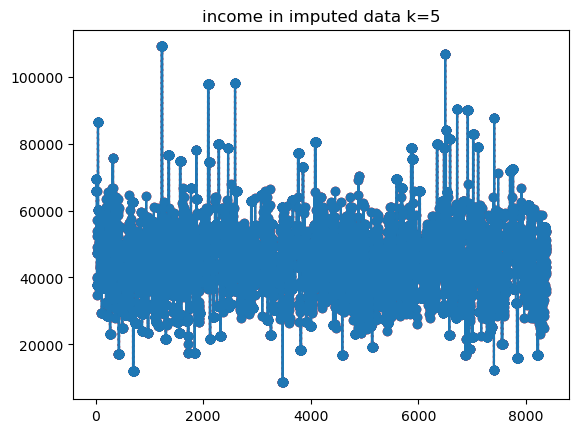

In [20]:
# Plot imputed data
data_clean_imputed5['income'][:8378].plot(color='red', marker='o', linestyle='dotted')
data_clean_imputed5['income'][:8378].plot(title='income in imputed data k=5', marker='o')

In [21]:
n_neighbors=10

data_imputer=KNNImputer(missing_values=np.nan, n_neighbors=10, 
weights='uniform', metric='nan_euclidean')
data_clean_imputed10 = pd.DataFrame(data_imputer.fit_transform(conti), 
columns=conti.columns)

In [22]:
data_clean_imputed10[['age','age_o','int_corr','income']].head()

,age,age_o,int_corr,income
0,21.0,27.0,0.14,69487.0
1,21.0,22.0,0.54,69487.0
2,21.0,22.0,0.16,69487.0
3,21.0,23.0,0.61,69487.0
4,21.0,24.0,0.21,69487.0


In [23]:
data_clean_imputed10[['age','age_o','int_corr','income']].describe()

,age,age_o,int_corr,income
count,8378.000000,8378.000000,8378.000000,8378.000000
mean,26.360647,26.362927,0.196318,44813.597302
std,3.550404,3.546143,0.301036,13202.380961
min,18.000000,18.000000,-0.830000,8607.000000
25%,24.000000,24.000000,-0.010000,36826.600000
50%,26.000000,26.000000,0.210000,44887.200000
75%,28.000000,28.000000,0.430000,51088.800000
max,55.000000,55.000000,0.910000,109031.000000


<AxesSubplot:title={'center':'income in imputed data k=10'}>

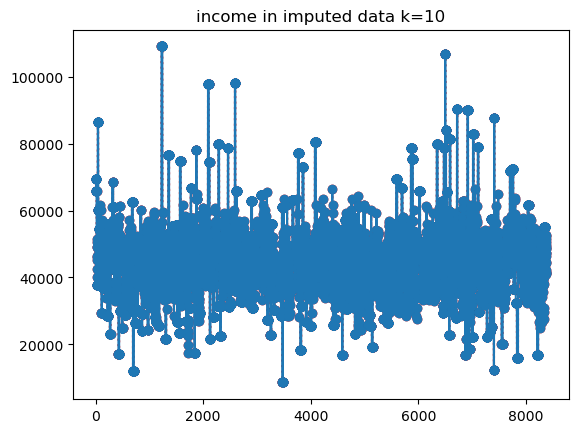

In [24]:
data_clean_imputed10['income'][:8378].plot(color='red', marker='o', linestyle='dotted')
data_clean_imputed10['income'][:8378].plot(title='income in imputed data k=10', marker='o')

Now I have to decide which of the 3 is better, to do that I am going to check how similar they are.

### Comparing dataframes.

To compare the dataset I will use the t test, which allows us to know if 2 populations are statistically similar or not. At the end of this test, we should obtain 2 values:
* t_stat (it is related to the difference between the means of the two groups, and while it is smaller it is considered that the groups are more equal)
* p_value (it is related to the probability of obtaining a difference in the means, a high value suggests that the groups migth be the same)

In [25]:
#2 Vs 10
df1 = data_clean_imputed2
df2 = data_clean_imputed10

results = []

for col in df1.columns:
    valor1 = df1[col]
    valor2 = df2[col]
    
    t_stat, p_valor = ttest_ind(valor1, valor2)
    
    results.append({"column": col, "t_stat": t_stat, "p_valor": p_valor})
    
for res in results:
    print("Column {}: t_stat = {:.2f}, p_valor = {:.3f}".format(res["column"], res["t_stat"], res["p_valor"]))


Column age: t_stat = -0.60, p_valor = 0.551
Column age_o: t_stat = -0.37, p_valor = 0.714
Column int_corr: t_stat = -0.02, p_valor = 0.984
Column income: t_stat = -3.56, p_valor = 0.000


In [26]:
#2 Vs 5

df1 = data_clean_imputed2
df2 = data_clean_imputed5

results = []

for col in df1.columns:
    valor1 = df1[col]
    valor2 = df2[col]
    
    t_stat, p_valor = ttest_ind(valor1, valor2)
    
    results.append({"column": col, "t_stat": t_stat, "p_valor": p_valor})
    
for res in results:
    print("Column {}: t_stat = {:.2f}, p_valor = {:.3f}".format(res["column"], res["t_stat"], res["p_valor"]))


Column age: t_stat = -0.71, p_valor = 0.479
Column age_o: t_stat = -0.37, p_valor = 0.709
Column int_corr: t_stat = -0.04, p_valor = 0.965
Column income: t_stat = -4.14, p_valor = 0.000


In [27]:
# 5 Vs 10

df1 = data_clean_imputed5
df2 = data_clean_imputed10

results = []

for col in df1.columns:
    valor1 = df1[col]
    valor2 = df2[col]
    
    t_stat, p_valor = ttest_ind(valor1, valor2)
    
    results.append({"column": col, "t_stat": t_stat, "p_valor": p_valor})
    
for res in results:
    print("Column {}: t_stat = {:.2f}, p_valor = {:.3f}".format(res["column"], res["t_stat"], res["p_valor"]))


Column age: t_stat = 0.11, p_valor = 0.912
Column age_o: t_stat = 0.01, p_valor = 0.995
Column int_corr: t_stat = 0.02, p_valor = 0.981
Column income: t_stat = 0.66, p_valor = 0.509


An improvement of the t_stat and p_value values is noted as K increases. Therefore, I will select the final dataframe between k=5 and k=10. Initially, I could choose any of them because t_stat is low and p_value is larger than 0.05 when comparing them. But since the column that had the most imputations was income and in all cases it is the one with the highest t_stat value and lowest p_valor value, I am going to see the error of each column in detail.

### Checking errors inside each column.

In [28]:
mae_age = mean_absolute_error(data_clean_imputed5['age'], data_clean_imputed10['age'])
r2_age = r2_score(data_clean_imputed5['age'], data_clean_imputed10['age'])

In [29]:
print(f" MAE of age is: {mae_age:.5f}")
print(f" R2 of age is: {r2_age:.5f}")

 MAE of age is: 0.01102
 R2 of age is: 0.99875


In [30]:
mae_int = mean_absolute_error(data_clean_imputed5['int_corr'], data_clean_imputed10['int_corr'])
r2_int = r2_score(data_clean_imputed5['int_corr'], data_clean_imputed10['int_corr'])

In [31]:
print(f" MAE of int_corr is: {mae_int:.5f}")
print(f" R2 of int_corr is: {r2_int:.5f}")

 MAE of int_corr is: 0.00148
 R2 of int_corr is: 0.99810


In [32]:
mae_inc = mean_absolute_error(data_clean_imputed5['income'], data_clean_imputed10['income'])
r2_inc = r2_score(data_clean_imputed5['income'], data_clean_imputed10['income'])
print(f" MAE of income is: {mae_int:.5f}")
print(f" R2 of income is: {r2_int:.5f}")

 MAE of income is: 0.00148
 R2 of income is: 0.99810


As the r2 is very close in all cases and the mae of income is much lower than the average or standard deviation of any of the df. I am going to choose the dataframe with k=5 simply because it is faster to calculate.

In [48]:
cont_data_cleaned = data_clean_imputed5

## Cleaning categorical values.

In [51]:
#Categorical values
cont = ['age','age_o','int_corr']
categorical = dropping(data,cont)

In [52]:
# Checking nulls
null_counts = categorical.isnull().sum()
null_columns = null_counts[null_counts == 0]
null_columns

iid         0
gender      0
idg         0
condtn      0
wave        0
round       0
position    0
order       0
partner     0
match       0
samerace    0
dec_o       0
dec         0
dtype: int64

In [53]:
nominal = ['race_o','race','goal','date','go_out','exphappy','met','match_es','satis_2','length','numdat_2']
ordinal = ['pf_o_att', 'pf_o_sin',
       'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'attr_o',
       'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o',
       'met_o', 'field_cd', 'imprace', 'imprelig', 'sports', 'tvsports',
       'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing',
       'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping',
       'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1',
       'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1',
       'attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1', 'amb3_1', 'attr5_1',
       'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1', 'attr', 'sinc',
       'intel', 'fun', 'amb', 'shar', 'like', 'prob']

In [54]:
categorical.columns

Index(['iid', 'id', 'gender', 'idg', 'condtn', 'wave', 'round', 'position',
       'positin1', 'order',
       ...
       'attr3_3', 'sinc3_3', 'intel3_3', 'fun3_3', 'amb3_3', 'attr5_3',
       'sinc5_3', 'intel5_3', 'fun5_3', 'amb5_3'],
      dtype='object', length=192)

In [55]:
nominal_columns = ['race_o','race','goal','date','go_out','exphappy','met','match_es','satis_2','length','numdat_2']
nominal_df = categorical[nominal_columns]

imputer = SimpleImputer(strategy='most_frequent')
imputed_nominal_df = pd.DataFrame(imputer.fit_transform(nominal_df), columns=nominal_columns)

In [56]:
imputed_nominal_df.head()

,race_o,race,goal,date,go_out,exphappy,met,match_es,satis_2,length,numdat_2
0,2.0,4.0,2.0,7.0,1.0,3.0,2.0,4.0,6.0,2.0,1.0
1,2.0,4.0,2.0,7.0,1.0,3.0,1.0,4.0,6.0,2.0,1.0
2,4.0,4.0,2.0,7.0,1.0,3.0,1.0,4.0,6.0,2.0,1.0
3,2.0,4.0,2.0,7.0,1.0,3.0,2.0,4.0,6.0,2.0,1.0
4,3.0,4.0,2.0,7.0,1.0,3.0,2.0,4.0,6.0,2.0,1.0


In [57]:
nominal_df.describe()

,race_o,race,goal,date,go_out,exphappy,met,match_es,satis_2,length,numdat_2
count,8305.000000,8315.000000,8299.000000,8281.000000,8299.000000,8277.000000,8003.000000,7205.000000,7463.000000,7463.000000,7433.000000
mean,2.756653,2.757186,2.122063,5.006762,2.158091,5.534131,0.948769,3.207814,5.711510,1.843495,2.338087
std,1.230689,1.230905,1.407181,1.444531,1.105246,1.734059,0.989889,2.444813,1.820764,0.975662,0.631240
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,2.000000,2.000000,1.000000,4.000000,1.000000,5.000000,0.000000,2.000000,5.000000,1.000000,2.000000
50%,2.000000,2.000000,2.000000,5.000000,2.000000,6.000000,0.000000,3.000000,6.000000,1.000000,2.000000
75%,4.000000,4.000000,2.000000,6.000000,3.000000,7.000000,2.000000,4.000000,7.000000,3.000000,3.000000
max,6.000000,6.000000,6.000000,7.000000,7.000000,10.000000,8.000000,18.000000,10.000000,3.000000,3.000000


In [58]:
imputed_nominal_df.describe()

,race_o,race,goal,date,go_out,exphappy,met,match_es,satis_2,length,numdat_2
count,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000
mean,2.750060,2.751492,2.111482,5.018262,2.156601,5.527692,0.906302,3.038709,5.743017,1.751373,2.299952
std,1.227331,1.228011,1.404722,1.440069,1.100129,1.724559,0.987171,2.305609,1.720805,0.957688,0.604114
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,2.000000,2.000000,1.000000,4.000000,1.000000,5.000000,0.000000,2.000000,5.000000,1.000000,2.000000
50%,2.000000,2.000000,2.000000,5.000000,2.000000,6.000000,0.000000,2.000000,6.000000,1.000000,2.000000
75%,4.000000,4.000000,2.000000,6.000000,3.000000,7.000000,2.000000,4.000000,7.000000,3.000000,3.000000
max,6.000000,6.000000,6.000000,7.000000,7.000000,10.000000,8.000000,18.000000,10.000000,3.000000,3.000000


The SimpleImputer with "most_frequent" strategy replaces missing values with the most frequent value in the column. When dealing with nominal categorical data, this can be a reasonable approach since the mode (most frequent value) is well-defined and provides a meaningful way to fill in the missing values.

Since the before and after dataframes are not statistically different, this suggests that the imputed values did not significantly change the distribution or summary statistics of the data.

In [59]:
ordinal_columns = ['pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'attr_o', 'sinc_o', 'intel_o', 
                   'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o', 'met_o', 'field_cd', 'imprace', 'imprelig', 'sports', 
                   'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 
                   'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 
                   'amb1_1', 'shar1_1', 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1', 'attr3_1', 'sinc3_1', 
                   'fun3_1', 'intel3_1', 'amb3_1', 'attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1', 'attr', 'sinc', 
                   'intel', 'fun', 'amb', 'shar', 'like', 'prob']

ordinal_df = categorical[ordinal_columns]


In [60]:
imputer = SimpleImputer(strategy='most_frequent')
imputed_ordinal_df = pd.DataFrame(imputer.fit_transform(ordinal_df), columns=ordinal_columns)

In [61]:
@widgets.interact(column=imputed_ordinal_df.columns)
def categorical_graphs(column):
    display(HTML(f'<h2>Distribution for {column}<h2>'))
    sns.histplot(data=imputed_ordinal_df, x=column)
    plt.show()

interactive(children=(Dropdown(description='column', options=('pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', …

Our ordinal data displays a variety of distributions, including those that are normal or close to normal, skewed, and displaying regularly increasing values. 

To handle these different distributions, imputing with the most frequent value is a logical choice. 

This approach can help avoid changing the distribution for normal and skewed data. However, when dealing with data that exhibits regular increase points, it can be challenging to decide on a constant value to impute the missing values, as the increase points can vary over time. That is we will also use most frequent approach for them.

## Combining the values into a final dataframe.

In [62]:
not_null_values = ['gender','condtn','wave','match','samerace','dec_o','dec']

In [64]:
# Final dataframe
imputed_cat_df = pd.concat([imputed_ordinal_df, imputed_nominal_df], axis=1)
imputed_cat_df = pd.concat([imputed_cat_df, categorical[not_null_values]], axis=1)
final_data = pd.concat([imputed_cat_df,cont_data_cleaned], axis=1)

In [65]:
final_data = final_data.rename(columns={0: 'col0', 1: 'col1', 2: 'col2', 3: 'col3', 4: 'col4'})
f_data=final_data.to_csv('data/fdata.csv', index=False)

In [66]:
final_data=pd.read_csv("data/fdata.csv")
final_data.columns

Index(['pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha',
       'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o',
       'prob_o', 'met_o', 'field_cd', 'imprace', 'imprelig', 'sports',
       'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming',
       'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music',
       'shopping', 'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1',
       'amb1_1', 'shar1_1', 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1',
       'amb2_1', 'shar2_1', 'attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1',
       'amb3_1', 'attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1', 'attr',
       'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob', 'race_o', 'race',
       'goal', 'date', 'go_out', 'exphappy', 'met', 'match_es', 'satis_2',
       'length', 'numdat_2', 'gender', 'condtn', 'wave', 'match', 'samerace',
       'dec_o', 'dec', 'age', 'age_o', 'int_corr', 'income'],
      dtype='object')

# 2. EDA

Let's start the EDA by understanding how the population is divided by their ability match and their gender.

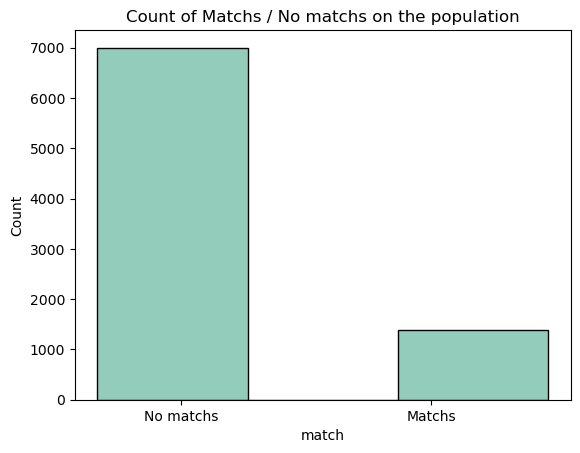

In [67]:
import seaborn as sns

sns.histplot(data=final_data, x='match', bins=2, binwidth=0.45, color='#71bca5')

# Configurar las etiquetas del eje x
plt.xticks([0.25, 1], ['No matchs', 'Matchs'])

plt.title('Count of Matchs / No matchs on the population')

# for i in range(len(final_data['match'].value_counts())):
#     count = final_data['match'].value_counts()[i]
#     plt.text(i, count+0.1, count, ha='center')

# Mostrar la gráfica
plt.show()


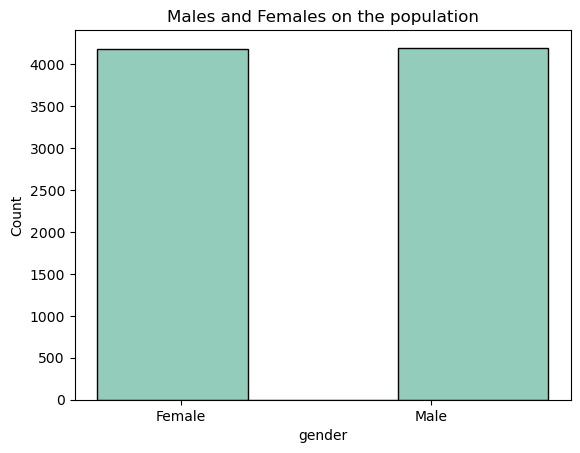

In [71]:
import seaborn as sns

sns.histplot(data=final_data, x='gender', bins=2, binwidth=0.45, color='#71bca5')

# Configurar las etiquetas del eje x
plt.xticks([0.25, 1], ['Female', 'Male'])

plt.title('Males and Females on the population')

# Mostrar la gráfica
plt.show()

In our experiance there are total 8.378 speed date happend. Unfortunatly only %16 has a positive match. From what we can see, the activity was based on the search for heterosexual couples, since the number of people who participated in the activity and who found a partner are similar between the 2 genders.

However, it is worth noting that there are slightly more male participants, with only a difference of 100 participants.

## Feature correlations.

Next we see the variables more and less correlated with match.

In [72]:
correlation_matrix = final_data.corr()
match_correlations = correlation_matrix['match']
most_positively_correlated = round(match_correlations.sort_values(ascending=False), 2).head(11)[1:10]
most_negatively_correlated = round(match_correlations.sort_values(ascending=True),2).head(11)[1:11]

fig = go.Figure(data=[go.Table(
    header=dict(values=['Feature','Correlation'],
                line_color='#e95551',
                fill_color='#ee6e5e',
                font=dict(color='black', size=20),
                align='center'),
    cells=dict(values=[most_positively_correlated.keys().tolist(), 
                    most_positively_correlated.values,
                       ],
               line_color='coral',
               fill=dict(color=['#fff2ef']),
               align='center',
               font=dict(color='black', size=15),
               height=30)
)])

fig = fig.update_layout(
        title= 'Top 10 Positive Correlated Features with Match Decision')
fig.show()

fig = go.Figure(data=[go.Table(
    header=dict(values=['Feature','Correlation'],
                line_color='#a5d6f7',
                fill_color='#71bca5',
                font=dict(color='black', size=20),
                align='center'),
    cells=dict(values=[most_negatively_correlated.keys().tolist(), 
                       most_negatively_correlated.values,
                       ],
               line_color='darkturquoise',
               fill_color='aliceblue',
               align='center',
               font=dict(color='black', size=15),
               height=30)
               )])

fig = fig.update_layout(
        title= 'Top 10 Negative Correlated Features with Match Decision')
fig.show()


We can observe the most correlated features with the match decision is the each individual decision but this is not surprising. Among the features that we can interpret, having fun that night and sharing interests are the most significant ones. Additionally, liking each other is one of the main reasons for a match decision.

In terms of negative correlations with the match decision, we don't see any highly negative correlated features. However, age differences are the most important factor to consider.

Since the dataframe contains lots of different columns that contain different information for EDA, we will group the similar ones together and check them one by one.

## Checking some main features.

In [73]:
hobies = final_data[['go_out', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga','gender','match']]
final_data['age_dff'] = final_data['age'] - final_data['age_o']
race_rel = final_data[['samerace','race_o','race','imprace', 'imprelig','match','gender']]
partner_rate = final_data[['dec_o', 'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o', 'like_o', 'prob_o', 'met_o','match','gender']]
partner_preferences = final_data[['pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha','match','gender']]
edu_car = final_data[['field_cd','gender','match']]
history = final_data[['goal','date','go_out','exphappy','match','gender']]
preferences = final_data[['attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1','match','gender']]
opposite_preferences = final_data[['attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1', 'shar2_1','match','gender']]
your_rate_general = final_data[['attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1', 'amb3_1','match','gender']]
other_rate_your_idea = final_data[['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1','match','gender']]
your_rate_partner = final_data[['attr', 'sinc', 'intel', 'fun', 'amb', 'shar','like', 'prob', 'met','match','gender']]

### Age

Now let's see if there is any age range that tends to be more successful when looking for a partner in these activities.

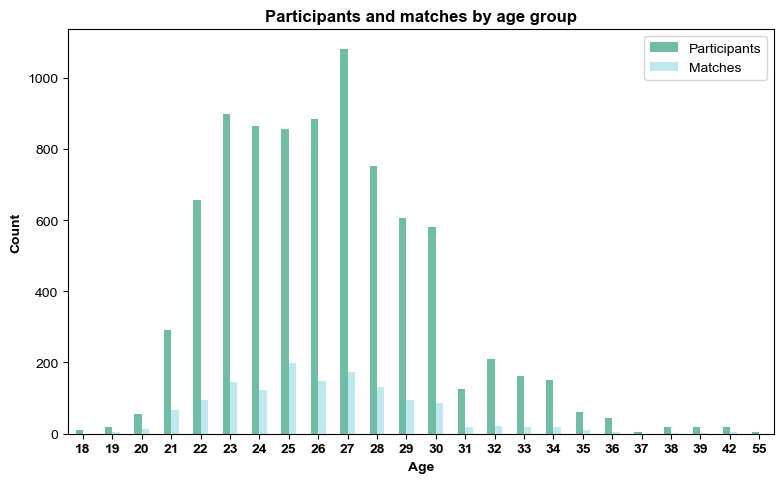

In [74]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np

age_df=final_data[['age','match']]

# Group by age and calculate match counts
age_df = age_df.groupby('age').agg({'match': ['count', 'sum']})
age_df.columns = ['Participants', 'Matches']
age_df = age_df.reset_index()

# Create age groups and group by age group
age_df['age_group'] =age_df['age'].astype('int')
age_group_df = age_df.groupby('age_group').sum()

# Plot bar chart
colors = ['#71bca5', '#c0e9ef'] # Set colors for bars
fig, ax = plt.subplots()
age_group_df.plot.bar(y=['Participants', 'Matches'], rot=0, ax=ax, color=colors)
ax.set_xlabel('Age', fontweight='bold')
ax.set_ylabel('Count', fontweight='bold')
ax.legend(['Participants', 'Matches'])
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_title('Participants and matches by age group', fontweight='bold')
sns.set(font_scale=1)

# Adjust layout
fig.set_size_inches(8, 5)
plt.tight_layout()
plt.show()


### Race

Let's start by understanding how the participants are divided by race.

In [75]:
race_rel['race_explanation'] = race_rel['race'].map({1:'Black/African American',2:'European/Caucasian-American',3:'Latino/Hispanic American',4:'Asian/Pacific Islander/Asian-American',5:'Native American',6:'Other'})
race_rel['race_o_explanation'] = race_rel['race_o'].map({1:'Black/African American',2:'European/Caucasian-American',3:'Latino/Hispanic American',4:'Asian/Pacific Islander/Asian-American',5:'Native American',6:'Other'})
race_exp_match = race_rel.groupby('race_explanation').agg({'match':['count','sum']})
race_exp_match.columns = ['total_date','positive_match']
race_exp_match = race_exp_match.reset_index()
race_exp_match['%'] = round((race_exp_match['positive_match'] / race_exp_match['total_date']) * 100,2)
race_exp_match.sort_values(by='total_date', ascending=False)
race_exp_match = race_exp_match.sort_values(by='total_date', ascending=False)
race_exp_match

,race_explanation,total_date,positive_match,%
2,European/Caucasian-American,4790,802,16.74
0,Asian/Pacific Islander/Asian-American,1982,267,13.47
3,Latino/Hispanic American,664,123,18.52
4,Other,522,103,19.73
1,Black/African American,420,85,20.24


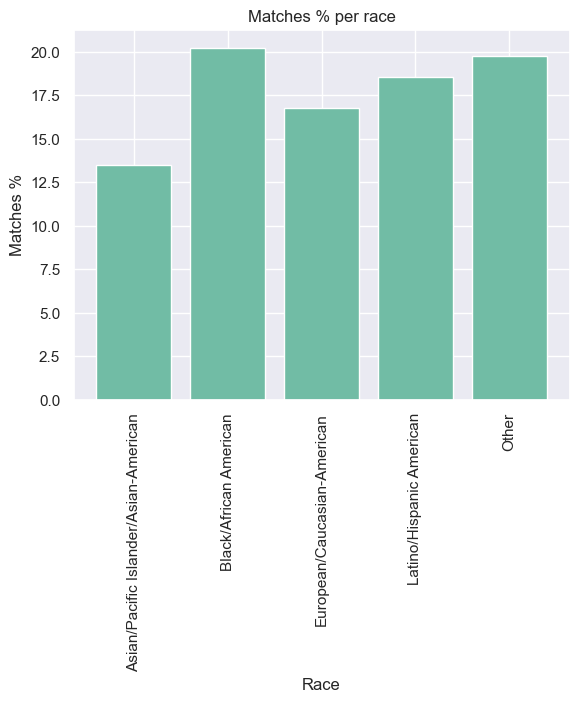

In [76]:
import matplotlib.pyplot as plt

# Crear la figura y los ejes
fig, ax = plt.subplots()

race_exp_match = race_exp_match.sort_values(by='race_explanation')
# Crear la gráfica de barras
ax.bar(race_exp_match['race_explanation'], race_exp_match['%'], color='#71bca5')

# Rotar las etiquetas del eje x para que sean legibles
plt.xticks(rotation=90)

# Añadir título y etiquetas a los ejes
ax.set_title('Matches % per race')
ax.set_xlabel('Race')
ax.set_ylabel('Matches %')

# for bar in bars:
#     height = bar.get_height()
#     ax.text(bar.get_x() + bar.get_width()/2, height, 
#     f'{height:.1f}%', ha='center', va='bottom')



# Mostrar la gráfica
plt.show()


- Most of the participants in this experiment are European. 
- The group with the highest positive match percentage is Black/African American at 20%, but the total number of participants in this group is too low to generate a reliable statistic. 
- For Asian/Pacific Islander/Asian-American participants, even though they are the second biggest group, their positive match percentage is lower than other groups.

In [77]:
for race in race_rel['race'].unique():
    race_df = final_data[final_data['race'] == race]
    race_corr = round(race_df.corr()['match'].sort_values(ascending=False)[1:6],2)
    race_explanation = race_rel.loc[race_rel['race'] == race, 'race_explanation'].iloc[0]
    print(f"Top 5 Correlations for {race_explanation}:")
    print(race_corr)
    print()

Top 5 Correlations for Asian/Pacific Islander/Asian-American:
dec_o     0.55
dec       0.43
like_o    0.27
prob_o    0.25
shar_o    0.25
Name: match, dtype: float64

Top 5 Correlations for European/Caucasian-American:
dec       0.56
dec_o     0.49
like      0.32
like_o    0.29
fun       0.28
Name: match, dtype: float64

Top 5 Correlations for Other:
dec_o     0.62
dec       0.50
like_o    0.37
attr_o    0.34
shar_o    0.32
Name: match, dtype: float64

Top 5 Correlations for Latino/Hispanic American:
dec      0.58
dec_o    0.52
fun      0.32
like     0.32
attr     0.30
Name: match, dtype: float64

Top 5 Correlations for Black/African American:
dec_o     0.60
dec       0.50
like_o    0.36
shar_o    0.34
fun_o     0.34
Name: match, dtype: float64



1. Among Asian/Pacific Islander/Asian-American and Black/African American individuals, the ratings provided by other people appear to be the most correlated features.

2. It appears that among European/Caucasian-American individuals, liking each other is the most correlated feature.

3. It seems that among Latino/Hispanic American individuals, the ratings they provide for other people are the most correlated features.

### Race and gender

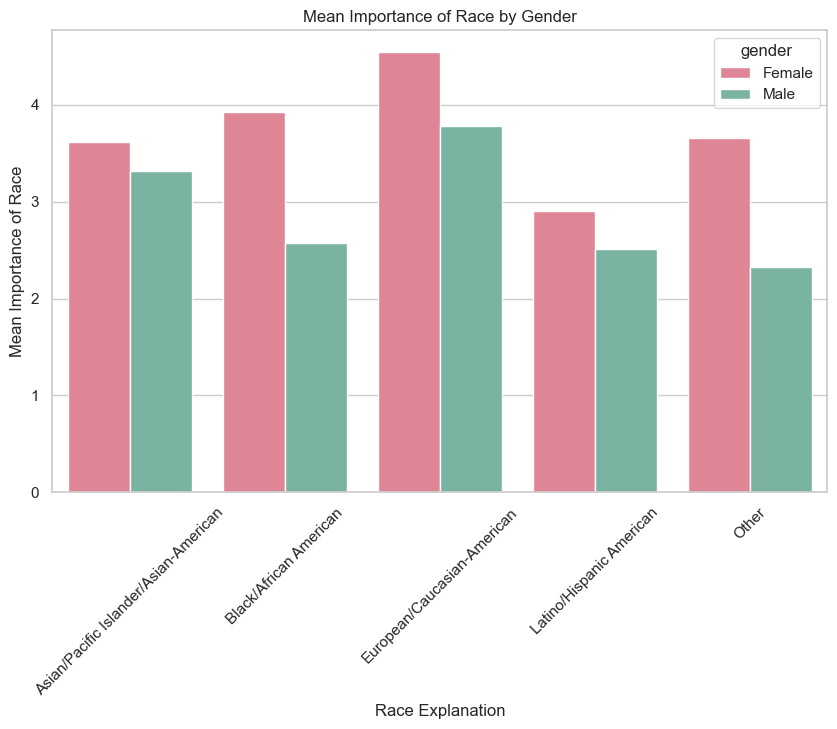

In [78]:
race_rel = race_rel.sort_values(by='race_explanation')

# Replace 0 with 'Female' and 1 with 'Male' in the gender column
race_rel['gender'] = race_rel['gender'].replace({0: 'Female', 1: 'Male'})

# Set the figure size and style
plt.figure(figsize=(10,6))
sns.set_style("whitegrid")

# Create a bar plot with separate bars for each value of 'race_explanation'
g = sns.barplot(x="race_explanation", y="imprace", hue="gender",
data=race_rel, ci=None, palette={"Female": "#ee778d", "Male": "#71bca5"})



# Set the x-axis label
plt.xlabel('Race Explanation')
plt.xticks(rotation=45)
# Set the y-axis label
plt.ylabel('Mean Importance of Race')

# Set the title
plt.title('Mean Importance of Race by Gender')

# Show the plot
plt.show()

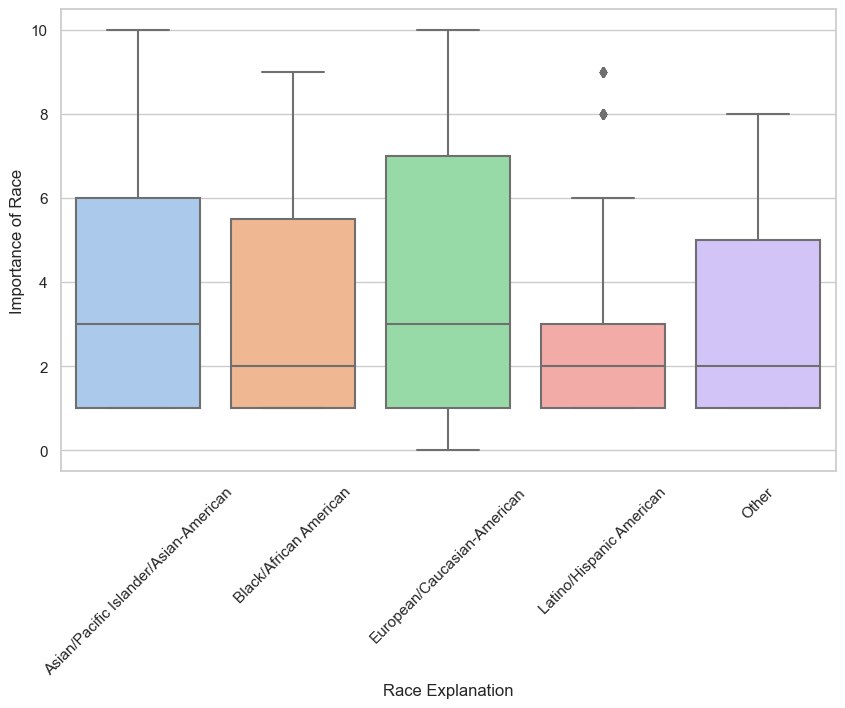

In [79]:
sns.set_theme(style="whitegrid", palette="pastel")
plt.figure(figsize=(10,6))
sns.boxplot(x="race_explanation", y="imprace",data=race_rel)
plt.xticks(rotation=45)

plt.xlabel('Race Explanation')
plt.xticks(rotation=45)
# Set the y-axis label
plt.ylabel('Importance of Race');


1. On average, the highest importance to the race coming from European - American people.

2. Race is more important for Female

### Religion and gender

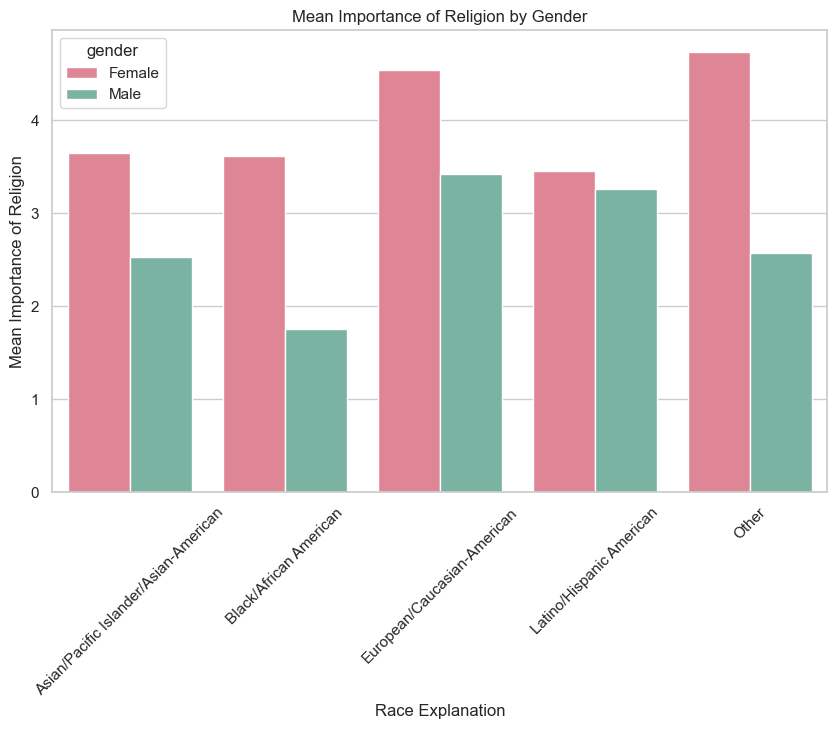

In [80]:
# Set the figure size and style
plt.figure(figsize=(10,6))
sns.set_style("whitegrid")

# Create a bar plot with separate bars for each value of 'race_explanation'
g = sns.barplot(x="race_explanation", y="imprelig", hue="gender",
data=race_rel, ci=None, palette={"Female": "#ee778d", "Male": "#71bca5"})



# Set the x-axis label
plt.xlabel('Race Explanation')
plt.xticks(rotation=45)
# Set the y-axis label
plt.ylabel('Mean Importance of Religion')

# Set the title
plt.title('Mean Importance of Religion by Gender')

# Show the plot
plt.show()


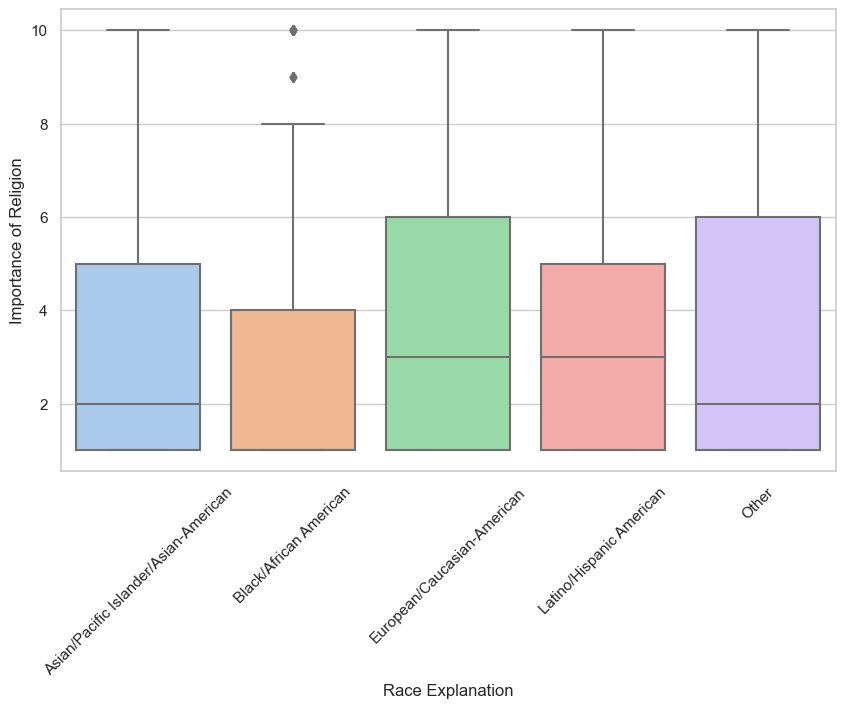

In [81]:
sns.set_theme(style="whitegrid", palette="pastel")
plt.figure(figsize=(10,6))
sns.boxplot(x="race_explanation", y="imprelig",data=race_rel)
plt.xticks(rotation=45)

plt.xlabel('Race Explanation')
plt.xticks(rotation=45)
# Set the y-axis label
plt.ylabel('Importance of Religion');

Religion is more important to Female

### Fields.

The last cultural aspect we want to see is their educational fields. We will begin by seeing a general table of the fields and then we will review their behavior with respect to matching.

In [82]:
edu_car['field'] = edu_car['field_cd'].map({1:'Law',2:'Math',3:'Social Science, Psychologist',4: 'Medical Science, Pharmaceuticals, and Bio Tech',
5:'Engineering',6:'English/Creative Writing/ Journalism',7:'History/Religion/Philosophy',8:'Business/Econ/Finance',9:'Education, Academia', 
10:'Biological Sciences/Chemistry/Physics',11:'Social Work',12:'Undergrad/undecided',13:'Political Science/International Affairs',
14:'Film',15:'Fine Arts/Arts Administration',16:'Languages',17:'Architecture',18:'Other'})

In [83]:
edu_car_match = edu_car.groupby('field').agg({'match':['count','sum']})
edu_car_match.columns = ['total_date','positive_match']
edu_car_match = edu_car_match.reset_index()
edu_car_match.sort_values(by='total_date', ascending=False)
edu_car_match = edu_car_match.rename(columns={'field': 'Field', 'total_date': 'Amount of participants', 'positive_match': 'Amount of Matches'})
edu_car_match

,Field,Amount of participants,Amount of Matches
0,Architecture,10,1
1,Biological Sciences/Chemistry/Physics,993,161
2,Business/Econ/Finance,2007,352
3,"Education, Academia",626,95
4,Engineering,864,117
5,English/Creative Writing/ Journalism,325,48
6,Film,126,23
7,Fine Arts/Arts Administration,187,22
8,History/Religion/Philosophy,241,40
9,Languages,40,12


In [84]:
import plotly.graph_objects as go

fig = go.Figure()

categories = edu_car_match['Field']
total_dates = edu_car_match['Amount of participants']
positive_matches = edu_car_match['Amount of Matches']

fig.add_trace(go.Scatterpolar(
      r=(positive_matches/total_dates)*100,
      theta=categories,
      fill='toself',
      name='Match relation per field',
      line_color='green'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 35]
    )),
  showlegend=False
)

fig.update_layout(
    title={
        'text': "Match % per field",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

As we can see the fields with higher matches are those associated with medicine and language. While those with the lowest relationships are undergraduates, architects and social workers.Let's look at this information with a little more detail and see how they separate by gender.

In [85]:
fig = go.Figure()

edu_car_match_f = edu_car[edu_car['gender'] == 0].groupby('field').agg({'match':['count','sum']})
edu_car_match_f.columns = ['total_date_f','positive_match_f']
edu_car_match_f = edu_car_match_f.reset_index()

edu_car_match_m = edu_car[edu_car['gender'] == 1].groupby('field').agg({'match':['count','sum']})
edu_car_match_m.columns = ['total_date_m','positive_match_m']
edu_car_match_m = edu_car_match_m.reset_index()

edu_car_match = pd.merge(edu_car_match_f, edu_car_match_m, on='field')
edu_car_match = edu_car_match.rename(columns={'field': 'Field', 'total_date_f': 'Female participants', 'positive_match_f': 'Females with matches',
'total_date_m': 'Male participants', 'positive_match_m': 'Male with matches'})

categories = edu_car_match['Field']
total_dates_f = edu_car_match['Female participants']
positive_matches_f = edu_car_match['Females with matches']
total_dates_m = edu_car_match['Male participants']
positive_matches_m = edu_car_match['Male with matches']

fig.add_trace(go.Scatterpolar(
      r=(positive_matches_m/total_dates_m)*100,
      theta=categories,
      fill='toself',
      name='Male Participants',
      line_color='#71bca5'
))

fig.add_trace(go.Scatterpolar(
      r=(positive_matches_f/total_dates_f)*100,
      theta=categories,
      fill='toself',
      name='Female Participants',
      line_color='#ee778d'
))



fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 40]
        )
    ),
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5
    ),
)

fig.update_layout(
    title={
        'text': " % of Men & Women that matched per Work Field",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

As we had seen previously, the 2 fields with the greatest success are associated with medicine and languages (Men have aslightly superior success in language while the same thing happens to women in medicine). In addition to these 2 fields, men stand out if they come from the film industry, while women have a better performance if they come from the financial or political sector.

To summarize this section of cultural background we can say that in general:
* Women give more importance to religion and race than men.
* The race with the highest percentage of success is black, while the one with the least success is the Asian.
* People who come from fields associated with medicine or language have the best performance independent of their genre.
* While the ones that come from the social work field, they have worse performance.

## Attributes preferences.

The first thing we will check in this section, is the preferences of men and women have of their opposive sex based on this 6 attributes:

* Attractive
* Sincerity
* Intelligence
* Fun
* Shared interests
* Ambition

In [86]:
df_gender_m = preferences.loc[preferences['gender'] == 1].groupby('match').mean()
df_gender_m = df_gender_m.rename(columns={'attr1_1': 'Attraction','sinc1_1': 'Sincerity',
'intel1_1': 'Intelligence', 'fun1_1': 'Fun', 'amb1_1': 'Ambition','shar1_1': 'Shared interests'
})
df_gender_m.drop(['gender'],axis=1, inplace=True)
df_gender_m = df_gender_m.rename(index={0: 'No match',1: 'Match'})
print("Preferences by men.")
df_gender_m

Preferences by men.


,Attraction,Sincerity,Intelligence,Fun,Ambition,Shared interests
match,,,,,,
No match,26.666798,16.715537,19.513450,17.699241,8.597417,11.113867
Match,28.015464,15.497435,19.672275,18.189435,8.410290,10.343159


In [87]:
df_gender_f = preferences.loc[preferences['gender'] == 0]
df_gender_f = df_gender_f.rename(columns={'attr1_1': 'Attraction','sinc1_1': 'Sincerity',
'intel1_1': 'Intelligence', 'fun1_1': 'Fun', 'amb1_1': 'Ambition','shar1_1': 'Shared interests'
})

In [88]:
df_gender_f = preferences.loc[preferences['gender'] == 0].groupby('match').mean()
df_gender_f = df_gender_f.rename(columns={'attr1_1': 'Attraction','sinc1_1': 'Sincerity',
'intel1_1': 'Intelligence', 'fun1_1': 'Fun', 'amb1_1': 'Ambition','shar1_1': 'Shared interests'
})
df_gender_f.drop(['gender'],axis=1, inplace=True)
df_gender_f = df_gender_f.rename(index={0: 'No match',1: 'Match'})
print("Preferences by Woman.")
df_gender_f

Preferences by Woman.


,Attraction,Sincerity,Intelligence,Fun,Ambition,Shared interests
match,,,,,,
No match,18.138835,18.327436,20.930930,17.043681,12.782089,12.794554
Match,17.798130,18.336377,21.279203,17.915884,12.814014,11.929188


              Attraction  Sincerity  Intelligence        Fun   Ambition  \
       match                                                              
female Match   17.798130  18.336377     21.279203  17.915884  12.814014   
male   Match   28.015464  15.497435     19.672275  18.189435   8.410290   

              Shared interests  
       match                    
female Match         11.929188  
male   Match         10.343159  
                     female       male
match                 Match      Match
Ambition          12.814014   8.410290
Attraction        17.798130  28.015464
Fun               17.915884  18.189435
Intelligence      21.279203  19.672275
Shared interests  11.929188  10.343159
Sincerity         18.336377  15.497435


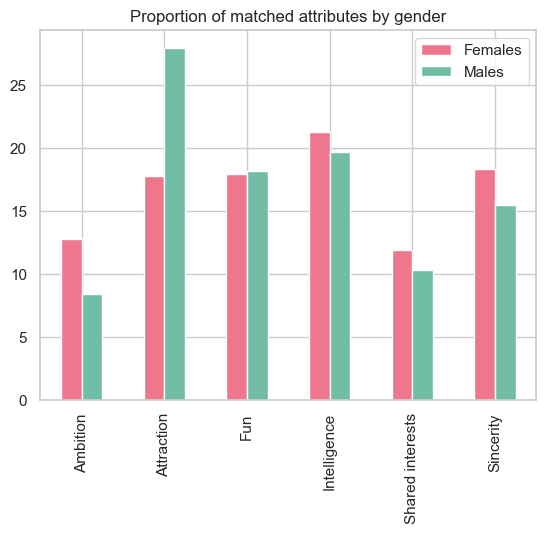

In [89]:
df_concat = pd.concat([df_gender_f, df_gender_m], keys=['female', 'male'])
df_plot = df_concat.loc[(['female', 'male'], 'Match'), :]
print(df_plot)
df_plott = df_plot.T.sort_index()
df_plott = df_plott.reindex(sorted(df_plott.columns), axis=1)
print(df_plott)
df_plott.plot(kind='bar', color=['#ee778d','#71bca5'])
ax.set_xlabel('Attributes')
ax.set_ylabel('Proportion (%)')
plt.title('Proportion of matched attributes by gender')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.5), borderaxespad=2)
plt.legend(labels=['Females', 'Males'])

plt.show()

But when comparing the attributes, we see that men place more emphasis on attraction than women, but their highest scoring attribute is intelligence. While women give more importance to sincerity, intelligence, ambition and common interests. Intelligence being the most important of all. In both cases the fun attribute comes out similarly high.

## Variables associated with the recreation and social activities.

Before starting the activities, the participants were asked if they had any hobbies. They were given 18 options to answer. Below we can see a table that explains their statistical behavior:

In [90]:
hobies = final_data[['go_out', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga','gender','match']]

In [91]:
t=hobies.describe().T
t.head()

,count,mean,std,min,25%,50%,75%,max
go_out,8378.0,2.156601,1.100129,1.0,1.0,2.0,3.0,7.0
sports,8378.0,6.440081,2.611085,1.0,5.0,7.0,9.0,10.0
tvsports,8378.0,4.541776,2.809963,1.0,2.0,4.0,7.0,10.0
exercise,8378.0,6.262354,2.413388,1.0,5.0,7.0,8.0,10.0
dining,8378.0,7.785868,1.746698,1.0,7.0,8.0,9.0,10.0


And here below we can see a table of how they correlate.

In [92]:
hobies.corr()

,go_out,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,gender,match
go_out,1.000000,-0.127555,-0.010071,-0.084177,-0.124684,0.051132,0.041584,0.037994,0.038909,-0.040264,0.063357,0.053881,0.044335,0.074958,0.007125,-0.021104,-0.031726,-0.023014,0.017408,-0.060291
sports,-0.127555,1.000000,0.468342,0.398777,-0.063250,-0.125750,-0.123007,0.181131,0.121509,0.054666,-0.137021,-0.095420,-0.251934,-0.153649,-0.015068,0.009814,-0.100760,-0.037454,0.227966,0.021900
tvsports,-0.010071,0.468342,1.000000,0.216923,-0.055333,-0.079578,-0.104606,-0.022710,0.264029,0.072996,-0.163428,0.250075,-0.089223,-0.021095,0.050081,0.043917,0.033366,-0.049840,0.150702,-0.005228
exercise,-0.084177,0.398777,0.216923,1.000000,0.085766,-0.007145,-0.010747,0.074579,-0.000323,0.021302,0.011574,0.027974,-0.013197,-0.054171,-0.051323,0.011841,0.088181,0.102409,-0.087081,0.009861
dining,-0.124684,-0.063250,-0.055333,0.085766,1.000000,0.386654,0.341653,0.077878,0.059983,0.231184,0.105242,0.112238,0.305762,0.231772,0.218762,0.197527,0.406955,0.172141,-0.205417,0.033808
museums,0.051132,-0.125750,-0.079578,-0.007145,0.386654,1.000000,0.857282,0.179415,-0.077724,0.114054,0.327026,0.026405,0.549553,0.318911,0.379141,0.270241,0.228635,0.259900,-0.213418,0.014879
art,0.041584,-0.123007,-0.104606,-0.010747,0.341653,0.857282,1.000000,0.196068,-0.070327,0.138738,0.241091,0.019594,0.526904,0.315224,0.404519,0.297335,0.220261,0.295652,-0.223127,0.031694
hiking,0.037994,0.181131,-0.022710,0.074579,0.077878,0.179415,0.196068,1.000000,0.146841,0.021053,0.047574,-0.145101,0.074554,0.016064,0.182721,0.057844,-0.110184,0.225211,-0.082739,0.024491
gaming,0.038909,0.121509,0.264029,-0.000323,0.059983,-0.077724,-0.070327,0.146841,1.000000,0.179802,-0.069000,0.195072,-0.040899,0.015206,0.097410,0.030485,0.087416,0.000991,0.222469,0.012692
clubbing,-0.040264,0.054666,0.072996,0.021302,0.231184,0.114054,0.138738,0.021053,0.179802,1.000000,-0.079928,0.019150,0.122359,0.116911,0.125639,0.132533,0.200013,0.062251,-0.064827,0.055508


After reviewing the information we can conclude that:
- Sports is correlated with tv sports, exercises and in smaller amount gaming
- Tv sports is more correlated with gaming, people who tend to spend time in the home might interested with boths
- Dining is correleted with museums, theater, art etc. art related hobbies
- Tv and shopping highly correlated

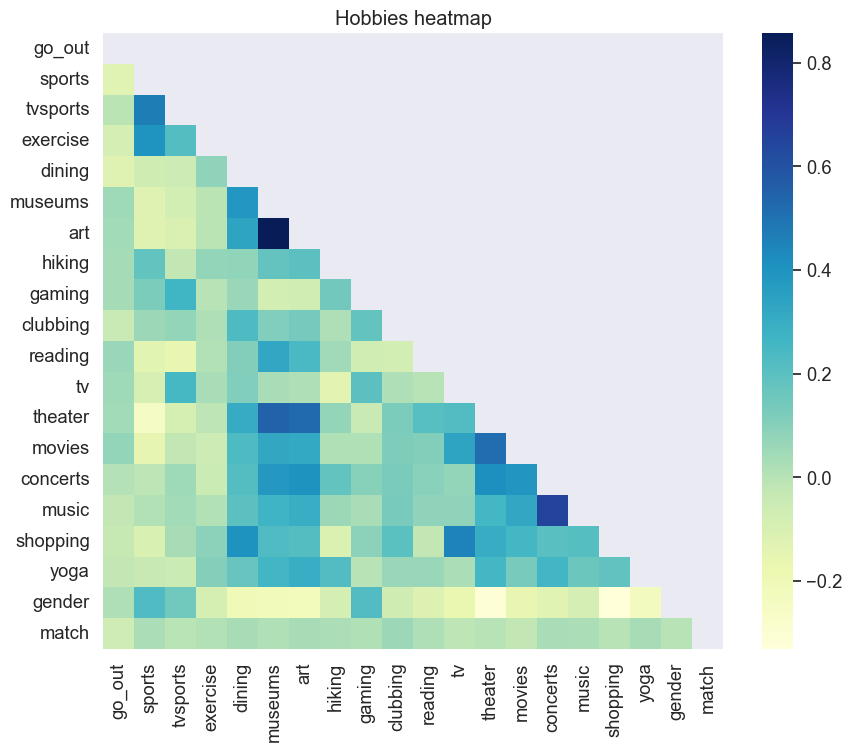

In [93]:

sns.set(font_scale=1.2)

# Hobbies
features = ['go_out', 'sports', 'tvsports', 'exercise', 'dining', 
            'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 
            'tv', 'theater', 'movies', 'concerts', 'music', 'shopping',
            'yoga','gender','match']

# Correlation matrix
corr_matrix = final_data[features].corr()
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(10, 8))

# heatmap
sns.heatmap(corr_matrix, cmap="YlGnBu", annot=False, mask=mask)

# Titles and labels conf,
plt.title('Hobbies heatmap')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


However, if we wanted to see this info in a more visual way, we can get an idea of the behavior by gender with this plot:

In [94]:
hobies_by_gender = hobies.groupby('gender')[hobies.columns[:-2]].mean().T
hobies_by_gender.rename(columns={1:'Male', 0:'Female'}, inplace=True)
hobies_by_gender = hobies_by_gender.reset_index()
hobies_by_gender = hobies_by_gender.rename_axis('index', axis='columns')
hobies_by_gender = hobies_by_gender.rename(columns={'index': 'hobbie'})

In [95]:
import plotly.graph_objects as go

fig = go.Figure()

categories = hobies_by_gender['hobbie']
values_male = hobies_by_gender['Male']
values_female = hobies_by_gender['Female']

fig.add_trace(go.Scatterpolar(
      r=values_male,
      theta=categories,
      fill='toself',
      name='Male Participants',
      line_color='#71bca5'
))

fig.add_trace(go.Scatterpolar(
      r=values_female,
      theta=categories,
      fill='toself',
      name='Female Participants',
      line_color='#ee778d'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 10]
    )),
  showlegend=True
)

fig.update_layout(
    title={
        'text': "Men and Women interest per activity (1-10)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}
)

fig.show()


As we can see there are differences in hobbies by gender:
* Women prefer dining, museums, art, tv, theater, shopping and yoga.
* while men prefer sports, tv sports and gaming.

Both genres have similar tastes in hiking, exercise, reading, clubbing, movies, music and going out.

And the activities that we had seen that they associated in the heatmap are activities preferred by women

### Frecuency of dates

In [96]:
history = final_data[['goal','date','go_out','exphappy','match','gender']]

In [97]:
history['date_exp'] = history['date'].map({1:'Several times a week',2:'Twice a week',3:'Once a week',4:'Twice a month',5:'Once a month',6:'Several times a year',7:'Almost never'})

In [98]:
date_df = history.groupby('date_exp').agg({'match': ['count', 'sum']})
date_df.columns = ['Number of participants','Number of matches']
date_df = date_df.reset_index()
date_df = date_df.rename(columns={'date_exp': 'Frecuency'})
date_df['Match relation'] = date_df['Number of matches'] / date_df['Number of participants']
date_df

,Frecuency,Number of participants,Number of matches,Match relation
0,Almost never,1434,212,0.147838
1,Once a month,1528,237,0.155105
2,Once a week,783,159,0.203065
3,Several times a week,94,29,0.308511
4,Several times a year,2191,313,0.142857
5,Twice a month,2040,365,0.178922
6,Twice a week,308,65,0.211039


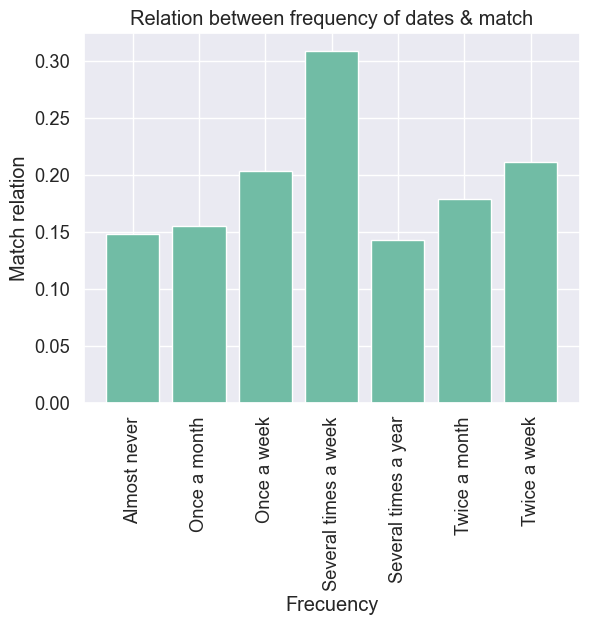

In [99]:
import matplotlib.pyplot as plt

# Calculamos la columna "Match relation"
date_df['Match relation'] = date_df['Number of matches'] / date_df['Number of participants']

# Hacemos la gráfica de barras
plt.bar(date_df['Frecuency'], date_df['Match relation'], color='#71bca5')
plt.xlabel('Frecuency')
plt.ylabel('Match relation')
plt.xticks(rotation=90)
plt.title('Relation between frequency of dates & match')
plt.show()


Here we see the phrase "practice makes perfect" is fulfilled, since the people who have the greatest chance of finding a partner after finishing the activity are those who go out on dates more frequently. While those who go out less frequently (several times a year & almost never) are the ones with the least chance of having a partner after finishing the activity.

### Frecuency of going out.

In [100]:
history['go_out_exp'] = history['go_out'].map({1:'Several times a week',2:'Twice a week',3:'Once a week',4:'Twice a month',5:'Once a month',6:'Several times a year',7:'Almost never'})

In [101]:
out_df = history.groupby('go_out_exp').agg({'match': ['count', 'sum']})
out_df.columns = ['Number of participants','Number of matches']
out_df = out_df.reset_index()
out_df = out_df.rename(columns={'go_out_exp': 'Frecuency'})
out_df['Match relation'] = out_df['Number of matches'] / out_df['Number of participants']
out_df

,Frecuency,Number of participants,Number of matches,Match relation
0,Almost never,37,1,0.027027
1,Once a month,164,19,0.115854
2,Once a week,1949,289,0.148281
3,Several times a week,2610,507,0.194253
4,Several times a year,99,13,0.131313
5,Twice a month,450,57,0.126667
6,Twice a week,3069,494,0.160964


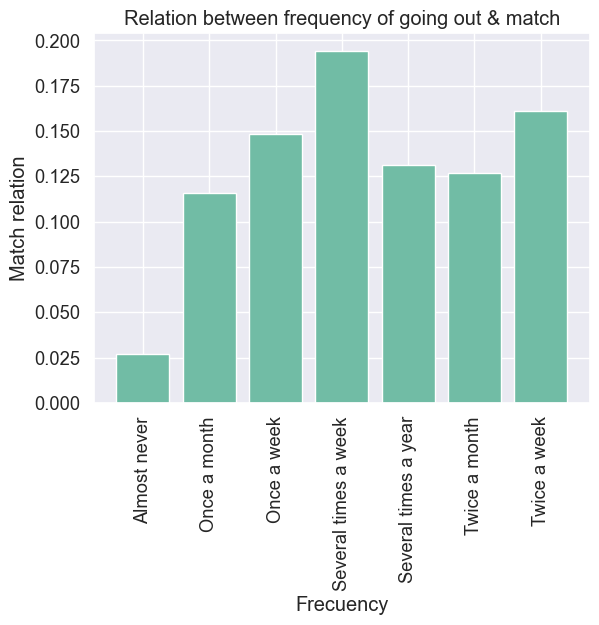

In [102]:

date_df['Match relation'] = out_df['Number of matches'] / out_df['Number of participants']

plt.bar(date_df['Frecuency'], date_df['Match relation'], color='#71bca5')
plt.xlabel('Frecuency')
plt.ylabel('Match relation')
plt.xticks(rotation=90)
plt.title('Relation between frequency of going out & match')
plt.show()

Here we can see a behavior similar to the previous one in the sense that the people who go out more are those who have the best chances of getting a partner.

To conclude this section we can say that:
* To improve the chances of finding a partner, it is recommended to practice socialization (this does not necessarily mean going out on dates, it is enough to go out and do activities outside the house).
* Women and men have different tastes when it comes to activities, however there are certain activities that have similar levels of interest such as hiking, clubbing and doing excercise

# 3. Machine Learning

## Using random forest.

In [ ]:
#!pip install imblearn

In [105]:
### Reading the final_data again
import pandas as pd
final_data=pd.read_csv("data/fdata.csv")
#print(final_data.columns)

In [106]:
# Creating X and y
X=final_data.drop(['dec_o','dec','match'], axis = 1)
y = np.array(final_data['match'])


feature_list = list(X.columns)

X = np.array(X)
#print(label[:6])
#print(features[:1])
print(len(feature_list))
# final_data.head(1)
# print(final_data.columns)

84


In [110]:
# Separating the groups
# I am using stratify to keep the same distribution between the training and testing groups
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
random_state=42, stratify=y)

In [114]:
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with 100 decision trees
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
# Train the model on training data
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

In [115]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
print("True Positives:", tp)
print("False Positives:", fp)
print("False Negatives:", fn)
print("True Negatives:", tn)

print(classification_report(y_test, y_pred))

True Positives: 108
False Positives: 44
False Negatives: 306
True Negatives: 2056
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      2100
           1       0.71      0.26      0.38       414

    accuracy                           0.86      2514
   macro avg       0.79      0.62      0.65      2514
weighted avg       0.84      0.86      0.83      2514



As we can see the data is unbalanced. Let´s balance it using SMOTE (Synthetic Minority Over-sampling Technique)

### With SMOTE

Training data shape: (9796, 84) (9796,)
Test data shape: (2514, 84) (2514,)
Validation data shape: (1684, 84) (1684,)


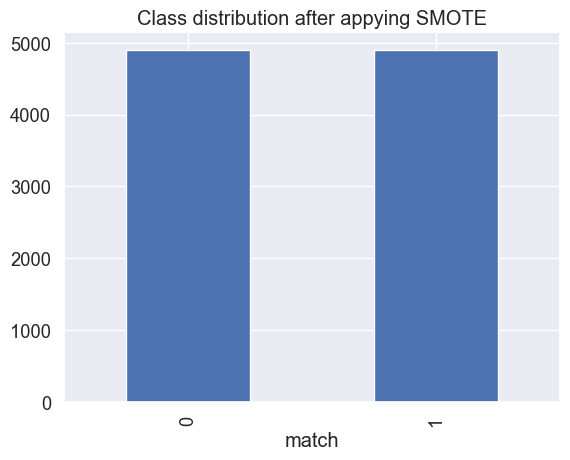

In [117]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Split the dataset into training, validation and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
random_state=42, stratify=y)

# instantiate SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training set only
X_train_r, y_train_r = smote.fit_resample(X_train, y_train)

pd.Series(y_train_r).value_counts().plot(kind='bar', 
        title='Class distribution after appying SMOTE', xlabel='match')
print('Training data shape:', X_train_r.shape, y_train_r.shape)
print('Test data shape:', X_test.shape, y_test.shape)
print('Validation data shape:', X_val.shape, y_val.shape)

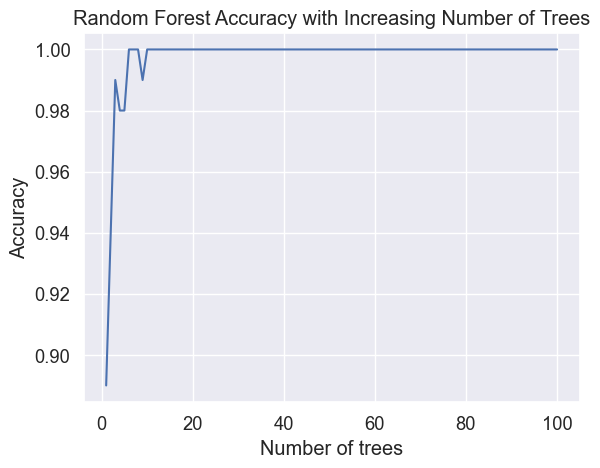

In [118]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt

# Generar un conjunto de datos de prueba
X= X_train_r
y= y_train_r

X, y = make_classification(n_samples=100, n_features=10, n_informative=5,
  n_redundant=0, random_state=0, shuffle=False)

# Crear una lista para almacenar los resultados de la métrica para 
# cada número de árboles
accuracy_results = []
accuracy_results2 = []
# Entrenar modelos de Random Forest con diferentes números de árboles
# y evaluar su precisión en el conjunto de datos de prueba
for i in range(1, 101):
    rf = RandomForestClassifier(n_estimators=i, random_state=0)
    rf.fit(X, y)
    accuracy = rf.score(X, y)
    accuracy_results.append(accuracy)

# Graficar los resultados de la métrica en función del número de árboles
# y encontrar el punto del codo
plt.plot(range(1, 101), accuracy_results)
plt.xlabel('Number of trees')
plt.ylabel('Accuracy')
plt.title('Random Forest Accuracy with Increasing Number of Trees')
plt.show()


**From now I wll use n_samples=22**

In [123]:
# Importing the model
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with 22 decision trees
rf = RandomForestClassifier(n_estimators = 22, random_state = 42)
# Train the model on training data
rf.fit(X_train_r, y_train_r)
y_pred = rf.predict(X_test)

In [124]:
from sklearn.metrics import classification_report
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
print("True Positives:", tp)
print("False Positives:", fp)
print("False Negatives:", fn)
print("True Negatives:", tn)
print(classification_report(y_test, y_pred))

True Positives: 168
False Positives: 115
False Negatives: 246
True Negatives: 1985
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      2100
           1       0.59      0.41      0.48       414

    accuracy                           0.86      2514
   macro avg       0.74      0.68      0.70      2514
weighted avg       0.84      0.86      0.85      2514



**precision**: Indicates the proportion of samples classified as positive that are actually positive. It is calculated as TP / (TP + FP), where TP is the number of true positives and FP is the number of false positives.

**recall**: Indicates the proportion of positive samples that were correctly classified. It is calculated as TP / (TP + FN), where TP is the number of true positives and FN is the number of false negatives.

## Checking the features importance.

To attempt improving the model, I check the variable´s importance. Now you will some rerunning of the model and a check of its performance.

In [125]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(X, round(importance, 2)) for X, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: shar_o               Importance: 0.1
Variable: attr_o               Importance: 0.07
Variable: attr                 Importance: 0.06
Variable: prob_o               Importance: 0.05
Variable: like                 Importance: 0.05
Variable: prob                 Importance: 0.05
Variable: like_o               Importance: 0.04
Variable: shar                 Importance: 0.04
Variable: fun_o                Importance: 0.03
Variable: fun                  Importance: 0.03
Variable: sinc                 Importance: 0.02
Variable: match_es             Importance: 0.02
Variable: pf_o_att             Importance: 0.01
Variable: pf_o_sin             Importance: 0.01
Variable: pf_o_int             Importance: 0.01
Variable: pf_o_fun             Importance: 0.01
Variable: pf_o_amb             Importance: 0.01
Variable: pf_o_sha             Importance: 0.01
Variable: sinc_o               Importance: 0.01
Variable: intel_o              Importance: 0.01
Variable: amb_o                Importance

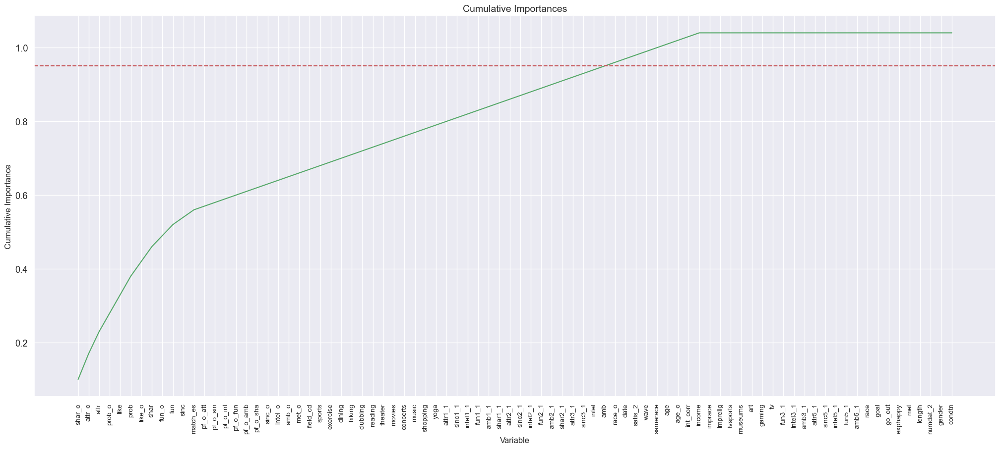

In [126]:
import matplotlib.pyplot as plt
import numpy as np

# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]

# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)

# Set the figure size and create the plot
fig, ax = plt.subplots(figsize=(25,10))
ax.plot(cumulative_importances, 'g-')

# Draw line at 95% of importance retained
ax.axhline(y=0.95, color='r', linestyle='--')

# Format x ticks and labels
ax.set_xticks(range(len(sorted_features)))
ax.set_xticklabels(sorted_features, rotation='vertical', fontsize=10)

# Axis labels and title
ax.set_xlabel('Variable', fontsize=12)
ax.set_ylabel('Cumulative Importance', fontsize=12)
ax.set_title('Cumulative Importances', fontsize=14)

# Show the plot
plt.show()


#### Rerunning the model  with features that have variable importance > 0.

In [127]:
final_data=pd.read_csv("data/fdata.csv")
# print(final_data.columns)

In [129]:
d_dec=final_data[['shar', 'fun_o', 'prob_o', 'like', 'shar_o', 'fun', 'attr_o', 'like_o', 'attr', 'intel_o', 'prob', 'sinc_o', 'intel',
'match_es', 'pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'amb_o', 'met_o', 'field_cd', 'imprace', 'imprelig',
'sports', 'tvsports', 'exercise', 'hiking', 'clubbing', 'tv', 'movies', 'yoga', 'attr1_1', 'intel1_1', 'amb1_1', 'shar1_1', 'attr2_1',
'shar2_1', 'attr3_1', 'sinc', 'amb', 'race_o', 'goal', 'date', 'met', 'satis_2', 'wave', 'samerace', 'age_o', 'int_corr', 'income','match']]
print(d_dec.columns)


Index(['shar', 'fun_o', 'prob_o', 'like', 'shar_o', 'fun', 'attr_o', 'like_o',
       'attr', 'intel_o', 'prob', 'sinc_o', 'intel', 'match_es', 'pf_o_att',
       'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'amb_o',
       'met_o', 'field_cd', 'imprace', 'imprelig', 'sports', 'tvsports',
       'exercise', 'hiking', 'clubbing', 'tv', 'movies', 'yoga', 'attr1_1',
       'intel1_1', 'amb1_1', 'shar1_1', 'attr2_1', 'shar2_1', 'attr3_1',
       'sinc', 'amb', 'race_o', 'goal', 'date', 'met', 'satis_2', 'wave',
       'samerace', 'age_o', 'int_corr', 'income', 'match'],
      dtype='object')


In [130]:
X= d_dec.drop('match', axis = 1)
y = np.array(final_data['match'])
feature_list = list(X.columns)

X = np.array(X)
print(len(feature_list))

52


In [131]:
# Split the dataset into training, validation and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.33, random_state=42, stratify=y_test)

# instantiate SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training set only
X_train_r, y_train_r = smote.fit_resample(X_train, y_train)

print('Training data shape:', X_train_r.shape, y_train_r.shape)
print('Test data shape:', X_test.shape, y_test.shape)
print('Validation data shape:', X_val.shape, y_val.shape)

Training data shape: (9796, 52) (9796,)
Test data shape: (830, 52) (830,)
Validation data shape: (1684, 52) (1684,)


In [132]:
# Importing the model
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 22, random_state = 42)
# Train the model on training data
rf.fit(X_train_r, y_train_r)
y_pred = rf.predict(X_test)


In [133]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       693
           1       0.66      0.45      0.53       137

    accuracy                           0.87       830
   macro avg       0.78      0.70      0.73       830
weighted avg       0.86      0.87      0.86       830



In [134]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(X, round(importance, 2)) for X, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: shar_o               Importance: 0.1
Variable: attr_o               Importance: 0.07
Variable: like_o               Importance: 0.07
Variable: attr                 Importance: 0.07
Variable: shar                 Importance: 0.05
Variable: fun_o                Importance: 0.05
Variable: like                 Importance: 0.05
Variable: fun                  Importance: 0.05
Variable: prob                 Importance: 0.05
Variable: prob_o               Importance: 0.03
Variable: match_es             Importance: 0.02
Variable: intel_o              Importance: 0.01
Variable: sinc_o               Importance: 0.01
Variable: intel                Importance: 0.01
Variable: pf_o_att             Importance: 0.01
Variable: pf_o_sin             Importance: 0.01
Variable: pf_o_int             Importance: 0.01
Variable: pf_o_fun             Importance: 0.01
Variable: pf_o_amb             Importance: 0.01
Variable: pf_o_sha             Importance: 0.01
Variable: amb_o                Importance

In [ ]:
# PLOT OF VARIABLE`S CUMULATIVE IMPORTANCE (IT LOOK SIMILAR TO ONE BEFORE), SO IT IS BETTER TO CHECK THE LIST BELOW.
# import matplotlib.pyplot as plt
# import numpy as np

# # List of features sorted from most to least important
# sorted_importances = [importance[1] for importance in feature_importances]
# sorted_features = [importance[0] for importance in feature_importances]

# # Cumulative importances
# cumulative_importances = np.cumsum(sorted_importances)

# # Set the figure size and create the plot
# fig, ax = plt.subplots(figsize=(45,20))
# ax.plot(cumulative_importances, 'g-')

# # Draw line at 95% of importance retained
# ax.axhline(y=0.95, color='r', linestyle='--')

# # Format x ticks and labels
# ax.set_xticks(range(len(sorted_features)))
# ax.set_xticklabels(sorted_features, rotation='vertical', fontsize=10)

# # Axis labels and title
# ax.set_xlabel('Variable', fontsize=16)
# ax.set_ylabel('Cumulative Importance', fontsize=16)
# ax.set_title('Cumulative Importances', fontsize=16)

# # Show the plot
# plt.show()

In [136]:
total_importance = 0
selected_features = []

for feature, importance in feature_importances:
    total_importance += importance
    selected_features.append(feature)
    if total_importance >= 0.95:
        break

print("The variables that predict 95% of the cases are:", selected_features)

The variables that predict 95% of the cases are: ['shar_o', 'attr_o', 'like_o', 'attr', 'shar', 'fun_o', 'like', 'fun', 'prob', 'prob_o', 'match_es', 'intel_o', 'sinc_o', 'intel', 'pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'amb_o', 'met_o', 'field_cd', 'imprace', 'imprelig', 'sports', 'tvsports', 'exercise', 'hiking', 'clubbing', 'tv', 'movies', 'yoga', 'attr1_1', 'intel1_1', 'amb1_1', 'shar1_1', 'attr2_1', 'shar2_1', 'attr3_1', 'sinc', 'amb', 'race_o', 'goal', 'date']


#### Rerunnning the model with more important variables.

Let´s see if we can improve it only using the more important ones.

In [ ]:
d_niv=final_data[['like', 'fun_o', 'attr_o', 'like_o', 'shar', 'prob_o', 'shar_o', 'fun','attr', 'prob',
'match_es', 'pf_o_att', 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'clubbing', 'attr1_1',
'intel1_1', 'attr2_1', 'age_o', 'int_corr', 'income' ,'age_dff', 'age_diff', 'intel_o', 'sinc_o', 'intel',
'amb_o','met_o','field_cd','imprace','imprelig','sports']]
print(d_niv.columns)


In [ ]:
X= d_niv
y = np.array(final_data['match'])
feature_list = list(X.columns)

X = np.array(X)
#print(label[:6])
#print(features[:1])
print(len(feature_list))

In [ ]:
# Split the dataset into training, validation and test
X_train, X_test, y_train, y_test = train_test_split(X, y,
test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, 
test_size=0.33, random_state=42, stratify=y_test)
# instantiate SMOTE
smote = SMOTE(random_state=42)

# # Apply SMOTE to the training set only
X_train_r, y_train_r = smote.fit_resample(X_train, y_train)

print('Training data shape:', X_train_r.shape, y_train_r.shape)
print('Test data shape:', X_test.shape, y_test.shape)
print('Validation data shape:', X_val.shape, y_val.shape)


In [ ]:
# Importing the model
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with 22 decision trees
rf = RandomForestClassifier(n_estimators = 22, random_state = 42)
# Train the model on training data
rf.fit(X_train_r, y_train_r)
y_pred = rf.predict(X_test)


In [ ]:
from sklearn.metrics import classification_report
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
print("True Positives:", tp)
print("False Positives:", fp)
print("False Negatives:", fn)
print("True Negatives:", tn)
print(classification_report(y_test, y_pred))

In [ ]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(X, round(importance, 2)) for X, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

#### Rerunnning the model only with important variables.

In [137]:
d_wiv=final_data[['like_o','attr','like', 'attr_o', 'fun_o', 'shar_o', 
'fun','shar', 'prob', 'pf_o_att', 'prob_o', 'int_corr','income']]
print(d_wiv.columns)
    

Index(['like_o', 'attr', 'like', 'attr_o', 'fun_o', 'shar_o', 'fun', 'shar',
       'prob', 'pf_o_att', 'prob_o', 'int_corr', 'income'],
      dtype='object')


In [138]:
X= d_wiv
y = np.array(final_data['match'])
feature_list = list(X.columns)

X = np.array(X)
#print(label[:6])
#print(features[:1])
print(len(feature_list))

13


In [139]:
# Split the dataset into training, validation and test
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.25, random_state=42)

# instantiate SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training set only
X_train_r, y_train_r = smote.fit_resample(X_train, y_train)

In [140]:
X_train_r, X_test, y_train_r, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.33, random_state=42, stratify=y_test)

print('Training data shape:', X_train_r.shape, y_train_r.shape)
print('Test data shape:', X_test.shape, y_test.shape)
print('Validation data shape:', X_val.shape, y_val.shape)

Training data shape: (5864, 13) (5864,)
Test data shape: (830, 13) (830,)
Validation data shape: (1684, 13) (1684,)


In [141]:
# Importing the model
# sklearn.ensemble.RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 22, random_state = 42)
# Train the model on training data
rf.fit(X_train_r, y_train_r)
y_pred = rf.predict(X_test)

In [142]:
#### from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.96      0.92       693
           1       0.63      0.31      0.42       137

    accuracy                           0.86       830
   macro avg       0.75      0.64      0.67       830
weighted avg       0.84      0.86      0.84       830



In [143]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(X, round(importance, 2)) for X, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:10} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: income     Importance: 0.11
Variable: int_corr   Importance: 0.1
Variable: like       Importance: 0.09
Variable: like_o     Importance: 0.08
Variable: attr_o     Importance: 0.08
Variable: pf_o_att   Importance: 0.08
Variable: attr       Importance: 0.07
Variable: fun_o      Importance: 0.07
Variable: shar_o     Importance: 0.07
Variable: fun        Importance: 0.07
Variable: prob       Importance: 0.07
Variable: shar       Importance: 0.06
Variable: prob_o     Importance: 0.06


From this analysis, we can infer the most important characteristics that lead to a successful match:

* Mutual attraction and fun are key factors.
* Having similar tastes also plays a significant role.
* Showing interest in seeing each other after the activity can be a strong predictor of a potential match.
* While income is one of the top variables, its importance is not significantly higher than the other factors, and it is not duplicated like the rest. Therefore, it can be considered as another significant aspect, but not necessarily the most critical one.

Although this analysis is a simplification of all the variables involved, it still provides valuable insights into the essential aspects that should be considered when selecting potential partners for app users. 

However, it is worth noting that this is just a starting point, and other factors may also be essential to consider, such as lifestyle preferences and personal values or shared goals.

### Cross validation

Finally we will use cross validation to see what happens if we mix the test and training groups.

In [144]:
from sklearn.model_selection import cross_val_score

X= d_wiv
y = np.array(final_data['match'])

# Random Forest model
rf_model = RandomForestClassifier(n_estimators = 22, random_state = 42)

# Cross validation with 5 folds
scores = cross_val_score(rf_model, X, y, cv=10)

# Scores
print("Cross validation scores:", scores)

# Imprimir el promedio y la desviación estándar de los scores
print("Score mean:", scores.mean())
print("Score standard deviation:", scores.std())

Cross validation scores: [0.85202864 0.86038186 0.86157518 0.84486874 0.86873508 0.85322196
 0.86515513 0.84725537 0.83990442 0.8614098 ]
Score mean: 0.8554536174483823
Score standard deviation: 0.008974927263298597


The standard deviation is little so is OK 

### Ploting the tree on the notebook

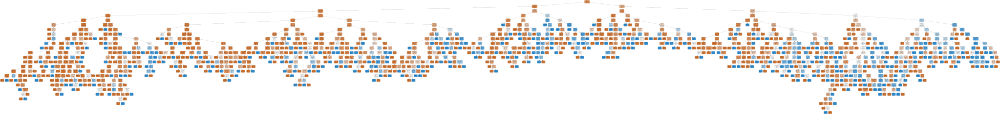

In [145]:
from sklearn.tree import export_graphviz
from IPython.display import display
import graphviz
from sklearn.ensemble import RandomForestClassifier

# Crear el modelo de Random Forest
rf = RandomForestClassifier(n_estimators=22, random_state=42)
rf.fit(X_train_r, y_train_r)

# Seleccionar el primer árbol de decisión del modelo
tree = rf.estimators_[10]

# Crear la representación gráfica del árbol de decisión
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=['like_o','attr','like', 'attr_o',
'fun_o', 'shar_o', 'fun','shar', 'prob', 'pf_o_att',
'prob_o', 'int_corr','income'],  
                           class_names=['0', '1'],  
                           filled=True, rounded=True,  
                           special_characters=True)  
graph = graphviz.Source(dot_data)  

# Mostrar la representación gráfica del árbol de decisión en el cuaderno
display(graph)


### Creating a pdf of the tree plot

In [ ]:
from sklearn.tree import export_graphviz
from IPython.display import display
import graphviz
from sklearn.ensemble import RandomForestClassifier

# Creating the Random Forest model
rf = RandomForestClassifier(n_estimators=22, random_state=42)
rf.fit(X_train_r, y_train_r)

# Selecting the tree
tree = rf.estimators_[10]

# Plotting the tree
dot_data = export_graphviz(tree, out_file=None, 
feature_names=['like_o','attr','like', 'attr_o','fun_o', 'shar_o', 
'fun','shar', 'prob', 'pf_o_att','prob_o', 'int_corr','income'],  
class_names=['0', '1'],  filled=True, rounded=True,  
special_characters=True)  

graph = graphviz.Source(dot_data)

filename = 'random_forest_tree.pdf'
graph.render(filename)

In [ ]:
graph.render('random_forest_tree')

### Ploting a little a tree on the notebook

In [ ]:
#!pip install graphviz

In [ ]:
from sklearn.tree import export_graphviz
from IPython.display import display
import graphviz
from sklearn.ensemble import RandomForestClassifier

# Crear el modelo de Random Forest con max_depth = 4
rf = RandomForestClassifier(n_estimators=22, max_depth=4, random_state=42)
rf.fit(X_train_r, y_train_r)

# Seleccionar el primer árbol de decisión del modelo
tree = rf.estimators_[0]

# Crear la representación gráfica del árbol de decisión
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=['like_o','attr','like', 'attr_o',
'fun_o', 'shar_o', 'fun','shar', 'prob', 'pf_o_att',
'prob_o', 'int_corr','income'],  
                           class_names=['0', '1'],  
                           filled=True, rounded=True,  
                           special_characters=True)  
filename = 'little_forest_tree.pdf'
graph.render(filename)

# Mostrar la representación gráfica del árbol de decisión en el cuaderno
display(graph)


### Ploting a little a tree on a pdf file.

In [ ]:
from sklearn.tree import export_graphviz
from IPython.display import display
import graphviz
from sklearn.ensemble import RandomForestClassifier

# Crear el modelo de Random Forest con max_depth = 4
rf = RandomForestClassifier(n_estimators=22, max_depth=4, random_state=42)
rf.fit(X_train_r, y_train_r)

# Seleccionar el primer árbol de decisión del modelo
tree = rf.estimators_[0]

# Crear la representación gráfica del árbol de decisión
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=['like_o','attr','like', 'attr_o',
'fun_o', 'shar_o', 'fun','shar', 'prob', 'pf_o_att',
'prob_o', 'int_corr','income'],  
                           class_names=['0', '1'],  
                           filled=True, rounded=True,  
                           special_characters=True)  
filename = 'little_forest_tree.pdf'
graph.render(filename)

# Mostrar la representación gráfica del árbol de decisión en el cuaderno
filename = 'random_forest_little_tree.pdf'
graph.render(filename)

From this analysis we can see which are the most important characteristics when making a match:
* The fact that they both find each other fun and attractive,
* Identify that they have similar tastes,
* Leave open the possibility of matching with the other person and therefore show interest in seeing each other after the activity.

This analysis is a simplification of all the variables involved, however, as we can see, it allows us to get an idea of which are the most important aspects that we should pay attention to when selecting possible partners for the users of an app.